In [1]:
!pip install gdown

  Running setup.py bdist_wheel for gdown ... - done
  Stored in directory: /root/.cache/pip/wheels/19/a6/67/ebb80360fc57bb0ddd5da77f57b275084cd8838bf7d5b91685
Successfully built gdown
You are using pip version 9.0.1, however version 20.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
import gdown

train_url = 'https://drive.google.com/uc?id=1-4WfgSQLMIMxl-vrqDjZTMiwb1w3qiJq'
val_url = 'https://drive.google.com/uc?id=1w9CuqPi3DbvbCN9DFGwLPeyYsXJvbjzk'
#the problem is that the whole file train+val is too big for kaggle!
#as kaggle gives 4.9gb of stage and the dataset is 2.8 gb
#since we are using zipped file first.
#https://drive.google.com/open?id=1-4WfgSQLMIMxl-vrqDjZTMiwb1w3qiJq --training
#https://drive.google.com/open?id=1w9CuqPi3DbvbCN9DFGwLPeyYsXJvbjzk --validation
output_train = 'dataset_train.zip'
output_val = 'dataset_val.zip'
gdown.download(train_url, output_train, quiet=False)
#os.remove(file_name)

Downloading...
From: https://drive.google.com/uc?id=1-4WfgSQLMIMxl-vrqDjZTMiwb1w3qiJq
To: /kaggle/working/dataset_train.zip
2.46GB [00:15, 156MB/s]


'dataset_train.zip'

In [3]:
import os
def create_dir(dir):
  if not os.path.exists(dir):
    os.makedirs(dir)
    print("Created Directory : ", dir)
    return
create_dir("/kaggle/working/data_aug/train")
!unzip -q /kaggle/working/dataset_train.zip -d /kaggle/working/data_aug/train

Created Directory :  /kaggle/working/data_aug/train


In [4]:
os.listdir("/kaggle/working/")

['dataset_train.zip', '__notebook__.ipynb', 'data_aug']

In [5]:
file_name="/kaggle/working/dataset_train.zip"
os.remove(file_name)

In [6]:
os.listdir("/kaggle/working/")

['__notebook__.ipynb', 'data_aug']

In [7]:
gdown.download(val_url, output_val, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1w9CuqPi3DbvbCN9DFGwLPeyYsXJvbjzk
To: /kaggle/working/dataset_val.zip
639MB [00:03, 165MB/s]


'dataset_val.zip'

In [8]:
os.listdir("/kaggle/working/")

['__notebook__.ipynb', 'dataset_val.zip', 'data_aug']

In [9]:
create_dir("/kaggle/working/data_aug/val")
!unzip -q /kaggle/working/dataset_val.zip -d /kaggle/working/data_aug/val

Created Directory :  /kaggle/working/data_aug/val


In [10]:
os.listdir("/kaggle/working/data_aug")
file_name="/kaggle/working/dataset_val.zip"
os.remove(file_name)

In [11]:
import os
"""
for dirname, _, filenames in os.walk('/kaggle/working'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
"""

"\nfor dirname, _, filenames in os.walk('/kaggle/working'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\n"

Hello everyone!! Hope everything is fine and you are enjoying things on Kaggle as usual. The rage for competing on Kaggle should never end. 
Machine Learning and Deep Learning have a huge scope in healthcare but applying them in healthcare isn't that simple. The stake is very high. It's more than just a `classification` problem. But if applied very carefully, it can benefit the world in enormous ways. **And as a Machine learning engineer, it's our responsibility to help people as much as we can in all possible ways.**

Pneumonia is a very common disease. It can be either: 1) Bacterial pneumonia  2) Viral Pneumonia  3) Mycoplasma pneumonia   and 4) Fungal pneumonia.
This dataset consists pneumonia samples belonging to the first two classes.  The dataset consists of only very few samples and that too unbalanced. The aim of this kernel is to develop a robust deep learning model from scratch on this limited amount of data. We all know that deep learning models are data hungry but if you know how things work, you can build good models even with a limited amount of data. 

In [12]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import os
import glob
import h5py
import shutil
import imgaug as aug
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import imgaug.augmenters as iaa
from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from PIL import Image
from pathlib import Path
from skimage.io import imread
from skimage.transform import resize
from keras.models import Sequential, Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten, SeparableConv2D
from keras.layers import GlobalMaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.layers.merge import Concatenate
from keras.models import Model
from keras.optimizers import Adam, SGD, RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import cv2
from keras import backend as K
color = sns.color_palette()
%matplotlib inline

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


['vgg16', 'beating-everything-with-depthwise-convolution', 'chest-xray-pneumonia']


Reproducibility is a great concern when doing deep learning. There was a good discussion on `KaggleNoobs` slack regarding this. We will set a numer of things in order to make sure that the results are almost reproducible(if not fully). 

In [13]:
import tensorflow as tf

# Set the seed for hash based operations in python
os.environ['PYTHONHASHSEED'] = '0'

# Set the numpy seed
np.random.seed(111)

# Disable multi-threading in tensorflow ops
session_conf = tf.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)

# Set the random seed in tensorflow at graph level
tf.set_random_seed(111)

# Define a tensorflow session with above session configs
sess = tf.Session(graph=tf.get_default_graph(), config=session_conf)

# Set the session in keras
K.set_session(sess)

# Make the augmentation sequence deterministic
aug.seed(111)

The dataset is divided into three sets: 1) train set    2) validation set    and 3) test set.  Let's grab the dataset   

In [14]:
# Define path to the data directory
#data_dir = Path('../input/chest-xray-pneumonia/chest_xray/chest_xray')
data_dir="abc"
# Path to train directory (Fancy pathlib...no more os.path!!)
#train_dir = data_dir / 'train'
train_dir="/kaggle/working/data_aug/train/content/data/content/FINAL_AUG_DATA/Train/"
# Path to validation directory
#val_dir = data_dir / 'val'
val_dir ="/kaggle/working/data_aug/val/content/data/content/FINAL_AUG_DATA/Val/"
# Path to test directory
#test_dir = data_dir / 'test'
test_dir = "/kaggle/working/data_aug/val/content/data/content/FINAL_AUG_DATA/Val/"

We will first go through the training dataset. We will do some analysis on that, look at some of the samples, check the number of samples for each class, etc.  Lets' do it.

Each of the above directory contains two sub-directories:
* `NORMAL`: These are the samples that describe the normal (no pneumonia) case.
* `VIRAL PNEUMONIA`: This directory contains those samples that are the pneumonia cases.
* `COVID-19`: This directory contains those samples that are the coronavirus cases.

In [15]:
# Get the path to the normal and pneumonia sub-directories
from os.path import join
normal_cases_dir =join(train_dir,'NORMAL')
covid_cases_dir=join(train_dir,'COVID-19')
pneumonia_cases_dir = join(train_dir,'Viral Pneumonia')

print(normal_cases_dir)
# Get the list of all the images
"""
normal_cases = normal_cases_dir.glob('*')
pneumonia_cases = pneumonia_cases_dir.glob('*')
covid_cases = covid_cases_dir.glob('*')
"""
normal_cases = glob.glob(str(normal_cases_dir)+"/*")
pneumonia_cases = glob.glob(str(pneumonia_cases_dir)+"/*")
covid_cases = glob.glob(str(covid_cases_dir)+"/*")

# An empty list. We will insert the data into this list in (img_path, label) format
train_data = []

# Go through all the normal cases. The label for these cases will be 0
for img in normal_cases:
    train_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    train_data.append((img, 1))
    
# Go through all the coronavirus cases. The label for these cases will be 2
for img in covid_cases:
    train_data.append((img, 2))
    

# Get a pandas dataframe from the data we have in our list 
train_data = pd.DataFrame(train_data, columns=['image', 'label'],index=None)

# Shuffle the data 
train_data = train_data.sample(frac=1.).reset_index(drop=True)

# How the dataframe looks like?
train_data.head()

/kaggle/working/data_aug/train/content/data/content/FINAL_AUG_DATA/Train/NORMAL


,image,label
0,/kaggle/working/data_aug/train/content/data/co...,2
1,/kaggle/working/data_aug/train/content/data/co...,0
2,/kaggle/working/data_aug/train/content/data/co...,0
3,/kaggle/working/data_aug/train/content/data/co...,0
4,/kaggle/working/data_aug/train/content/data/co...,1


In [16]:
train_data.shape

(7161, 2)

In [17]:
9000*0.8

7200.0

### How many samples for each class are there in the dataset?

1    2400
0    2400
2    2361
Name: label, dtype: int64


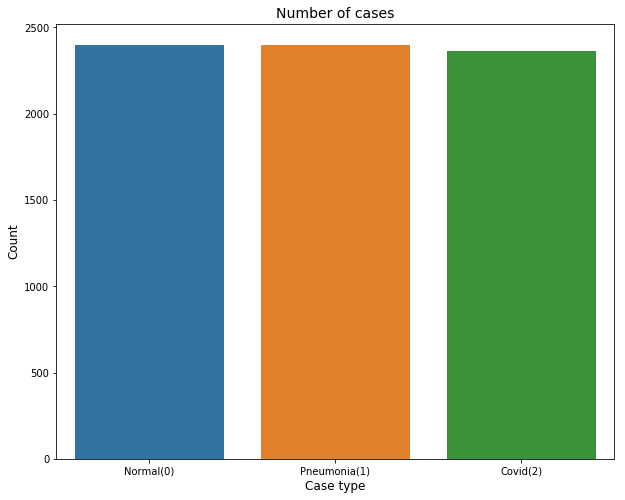

In [18]:
# Get the counts for each class
cases_count = train_data['label'].value_counts()
print(cases_count)

# Plot the results 
plt.figure(figsize=(10,8))
sns.barplot(x=cases_count.index, y= cases_count.values)
plt.title('Number of cases', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(cases_count.index)), ['Normal(0)', 'Pneumonia(1)','Covid(2)'])
plt.show()

As you can see the data is highly imbalanced. We have almost with thrice pneumonia cases here as compared to the normal cases. This situation is very normal when it comes to medical data. The data will always be imbalanced. either there will be too many normal cases or there will be too many cases with the disease. 

Let's look at how a normal case is different from that of a pneumonia case. We will look at somes samples from our training data itself.

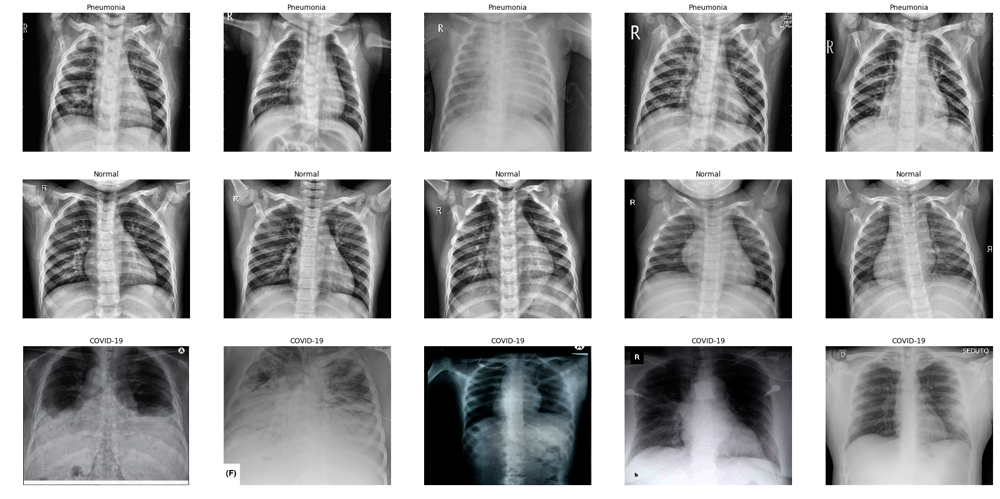

In [19]:
# Get few samples for both the classes
pneumonia_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
normal_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
covid_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()
# Concat the data in a single list and del the above two list
samples = pneumonia_samples + normal_samples+covid_samples
del pneumonia_samples, normal_samples,covid_samples

# Plot the data 
f, ax = plt.subplots(3,5, figsize=(30,15))
for i in range(15):
    img = imread(samples[i])
    ax[i//5, i%5].imshow(img, cmap='gray')
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    elif i<10:
        ax[i//5, i%5].set_title("Normal")
    else:
        ax[i//5, i%5].set_title("COVID-19")
    
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

If you look carefully, then there are some cases where you won't be able to differentiate between a normal case and a pneumonia case with the naked eye. There is one case in the above plot, at least for me ,which is too much confusing. If we can build a robust classifier, it would be a great assist to the doctor too.

### Preparing validation data
We will be defining a generator for the training dataset later in the notebook but as the validation data is small, so I can read the images and can load the data without the need of a generator.  This is exactly what the code block given below is doing.

In [20]:
# Get the path to the sub-directories
normal_cases_dir = join(val_dir,'NORMAL')
pneumonia_cases_dir =join(val_dir,'Viral Pneumonia')
covid_cases_dir=join(val_dir,'COVID-19')

# Get the list of all the images
#normal_cases = normal_cases_dir.glob('*.jpeg')
#pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')



normal_cases = glob.glob(str(normal_cases_dir)+"/*")
pneumonia_cases = glob.glob(str(pneumonia_cases_dir)+"/*")
covid_cases = glob.glob(str(covid_cases_dir)+"/*")




# List that are going to contain validation images data and the corresponding labels
valid_data = []
valid_labels = []


# Some images are in grayscale while majority of them contains 3 channels. So, if the image is grayscale, we will convert into a image with 3 channels.
# We will normalize the pixel values and resizing all the images to 224x224 

# Normal cases
for img in normal_cases:
    img = cv2.imread(str(img))
    try:
        img = cv2.resize(img, (224,224),interpolation = cv2.INTER_AREA)
    except:
        raise ERR
        continue
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(0, num_classes=3)
    valid_data.append(img)
    valid_labels.append(label)
                      
# Pneumonia cases        
for img in pneumonia_cases:
    img = cv2.imread(str(img))
    try:
        img = cv2.resize(img, (224,224),interpolation = cv2.INTER_AREA)
    except:
        raise ERR
        continue
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(1, num_classes=3)
    valid_data.append(img)
    valid_labels.append(label)
    
    
# Coronavirus cases        
for img in covid_cases:
    img = cv2.imread(str(img))
    try:
        img = cv2.resize(img, (224,224),interpolation = cv2.INTER_AREA)
    except:
        raise ERR
        continue
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(2, num_classes=3)
    valid_data.append(img)
    valid_labels.append(label)
# Convert the list into numpy arrays
valid_data = np.array(valid_data)
valid_labels = np.array(valid_labels)

print("Total number of validation examples: ", valid_data.shape)
print("Total number of labels:", valid_labels.shape)

Total number of validation examples:  (1792, 224, 224, 3)
Total number of labels: (1792, 3)


In [21]:
9000*0.2

1800.0

## Augmentation
Data augmentation is a powerful technique which helps in almost every case for improving the robustness of a model. But augmentation can be much more helpful where the dataset is imbalanced. You can generate different samples of undersampled class in order to try to balance the overall distribution. 

I like [imgaug](https://imgaug.readthedocs.io/en/latest/) a lot. It comes with a very clean api and you can do hell of augmentations with it. It's worth exploring!!
In the next code block, I will define a augmentation sequence. You will notice `Oneof` and it does exactly that. At each iteration, it will take one augmentation technique out of the three and will apply that on the samples 

In [22]:
# Augmentation sequence 
seq = iaa.OneOf([
    #iaa.Fliplr(), # horizontal flips
    #iaa.Affine(rotate=20), # roatation
    iaa.Multiply((1.2, 1.5))]) #random brightness

### Training data generator 
Here I will define a very simple data generator. You can do more than this if you want but I think at this point, this is more than enough I need.

In [23]:
def data_gen(data, batch_size):
    # Get total number of samples in the data
    n = len(data)
    steps = n//batch_size
    
    # Define two numpy arrays for containing batch data and labels
    batch_data = np.zeros((batch_size, 224, 224, 3), dtype=np.float32)
    batch_labels = np.zeros((batch_size,3), dtype=np.float32)

    # Get a numpy array of all the indices of the input data
    indices = np.arange(n)
    
    # Initialize a counter
    i =0
    while True:
        np.random.shuffle(indices)
        # Get the next batch 
        count = 0
        next_batch = indices[(i*batch_size):(i+1)*batch_size]
        for j, idx in enumerate(next_batch):
            img_name = data.iloc[idx]['image']
            label = data.iloc[idx]['label']
            
            # one hot encoding
            encoded_label = to_categorical(label, num_classes=3)
            # read the image and resize
            img = cv2.imread(str(img_name))
            img = cv2.resize(img, (224,224))
            
            # check if it's grayscale
            #if img.shape[2]==1:
            #    img = np.dstack([img, img, img])
            
            # cv2 reads in BGR mode by default
            orig_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # normalize the image pixels
            orig_img = img.astype(np.float32)/255.
            
            batch_data[count] = orig_img
            batch_labels[count] = encoded_label
            
            # generating more samples of the undersampled class
            if label==0 and count < batch_size-2:
            #    aug_img1 = seq.augment_image(img)
            #    aug_img2 = seq.augment_image(img)
            #    aug_img1 = cv2.cvtColor(aug_img1, cv2.COLOR_BGR2RGB)
            #    aug_img2 = cv2.cvtColor(aug_img2, cv2.COLOR_BGR2RGB)
            #    aug_img1 = aug_img1.astype(np.float32)/255.
            #    aug_img2 = aug_img2.astype(np.float32)/255.

            #    batch_data[count+1] = aug_img1
            #    batch_labels[count+1] = encoded_label
            #    batch_data[count+2] = aug_img2
            #    batch_labels[count+2] = encoded_label
                count +=2
            
            else:
                count+=1
            
            if count==batch_size-1:
                break
            
        i+=1
        yield batch_data, batch_labels
            
        if i>=steps:
            i=0

## Model 

This is the best part. If you look at other kernels on this dataset, everyone is busy doing transfer learning and fine-tuning. **You should transfer learn but wisely**.  We will be doing partial transfer learning and rest of the model will be trained from scratch. I will explain this in detail but before that, I would love to share one of the best practices when it comes to building deep learning models from scratch on limited data.

1. Choose a simple architecture.
2. Initialize the first few layers from a network that is pretrained on imagenet. This is because first few layers capture general details like color blobs, patches, edges, etc. Instead of randomly initialized weights for these layers, it would be much better if you fine tune them.
3. Choose layers that introduce a lesser number of parameters. For example, `Depthwise SeparableConv` is a good replacement for `Conv` layer. It introduces lesser number of parameters as compared to normal convolution and as different filters are applied to each channel, it captures more information.  `Xception` a powerful network, is built on top of such layers only. You can read about `Xception` and `Depthwise Separable Convolutions` in [this](https://arxiv.org/abs/1610.02357) paper.
4. Use batch norm with convolutions.  As the network becomes deeper, batch norm start to play an important role.
5. Add dense layers with reasonable amount of neurons. Train with a higher learning rate and experiment with the number of neurons in the dense layers. Do it for the depth of your network too. 
6. Once you know a good depth, start training your network with a lower learning rate along with decay.  

This is all that I have done in the next code block.


In [24]:
def build_model():
    input_img = Input(shape=(224,224,3), name='ImageInput')
    x = Conv2D(32, (3,3), activation='relu', padding='same', name='Conv0_1')(input_img)
    x = Conv2D(32, (3,3), activation='relu', padding='same', name='Conv0_2')(x)
    x = MaxPooling2D((2,2), name='pool0')(x)
    
    x = SeparableConv2D(64, (3,3), activation='relu', padding='same', name='Conv1_1')(x)
    x = SeparableConv2D(64, (3,3), activation='relu', padding='same', name='Conv1_2')(x)
    x = MaxPooling2D((2,2), name='pool1')(x)
    
    x = SeparableConv2D(128, (3,3), activation='relu', padding='same', name='Conv2_1')(x)
    x = SeparableConv2D(128, (3,3), activation='relu', padding='same', name='Conv2_2')(x)
    x = MaxPooling2D((2,2), name='pool2')(x)
    
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_1')(x)
    x = BatchNormalization(name='bn1')(x)
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_2')(x)
    x = BatchNormalization(name='bn2')(x)
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_3')(x)
    x = MaxPooling2D((2,2), name='pool3')(x)
    
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_1')(x)
    x = BatchNormalization(name='bn3')(x)
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_2')(x)
    x = BatchNormalization(name='bn4')(x)
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_3')(x)
    x = MaxPooling2D((2,2), name='pool4')(x)
    
    x = Flatten(name='flatten')(x)
    x = Dense(1024, activation='relu', name='fc1')(x)
    x = Dropout(0.7, name='dropout1')(x)
    x = Dense(512, activation='relu', name='fc2')(x)
    x = Dropout(0.5, name='dropout2')(x)
    x = Dense(3, activation='softmax', name='fc3')(x)
    
    model = Model(inputs=input_img, outputs=x)
    return model

In [25]:
def build_model2():
    input_img = Input(shape=(224,224,3), name='ImageInput')
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv1_1')(input_img)
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv1_2')(x)
    x = MaxPooling2D((2,2), name='pool1')(x)
    
    x = SeparableConv2D(128, (3,3), activation='relu', padding='same', name='Conv2_1')(x)
    x = SeparableConv2D(128, (3,3), activation='relu', padding='same', name='Conv2_2')(x)
    x = MaxPooling2D((2,2), name='pool2')(x)
    
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_1')(x)
    x = BatchNormalization(name='bn1')(x)
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_2')(x)
    x = BatchNormalization(name='bn2')(x)
    x = SeparableConv2D(256, (3,3), activation='relu', padding='same', name='Conv3_3')(x)
    x = MaxPooling2D((2,2), name='pool3')(x)
    
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_1')(x)
    x = BatchNormalization(name='bn3')(x)
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_2')(x)
    x = BatchNormalization(name='bn4')(x)
    x = SeparableConv2D(512, (3,3), activation='relu', padding='same', name='Conv4_3')(x)
    x = MaxPooling2D((2,2), name='pool4')(x)
    
    x = Flatten(name='flatten')(x)
    x = Dense(1024, activation='relu', name='fc1')(x)
    x = Dropout(0.7, name='dropout1')(x)
    x = Dense(512, activation='relu', name='fc2')(x)
    x = Dropout(0.5, name='dropout2')(x)
    x = Dense(3, activation='softmax', name='fc3')(x)
    
    model = Model(inputs=input_img, outputs=x)
    return model

In [26]:
model =  build_model()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

In [27]:
#!pip install pydot==1.2.3

In [28]:
#import pydot

In [29]:
#!pip install graphviz

In [30]:
#!brew install graphviz

In [31]:
#!pip install pydot-ng


In [32]:
#import pydot_ng as pydot
#pydot.find_graphviz()


In [33]:
#from keras.utils.vis_utils import plot_model
#plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [34]:
#!pip install ann_visualizer

In [35]:

#from ann_visualizer.visualize import ann_viz;

#ann_viz(model, title="COVIDDepthConv")

In [36]:
"""
from keras.applications.xception import Xception
X_Model=Xception(weights='imagenet', include_top=True)
X_Model.summary()

X_Model.layers
X_Model.save("Xception.hdf5")
os.listdir("/kaggle/working")

# Open the VGG16 weight file
f = h5py.File('Xception.hdf5', 'r')

for key in f["model_weights"].keys():
    print(key)
    
print()
for key in f["model_weights"]["block10_sepconv1"]["block10_sepconv1_2"]["depthwise_kernel:0"].keys():
    print(key)
"""
#depthwise_kernel:0
#pointwise_kernel:0

#print(f)
# Select the layers for which you want to set weight.
"""
w,b = f['block10_sepconv1']['block10_sepconv1_W_1:0'], f['block10_sepconv1']['block10_sepconv1_b_1:0']
model.layers[4].set_weights = [w,b]

w,b = f['block1_conv2']['block1_conv2_W_1:0'], f['block1_conv2']['block1_conv2_b_1:0']
model.layers[5].set_weights = [w,b]

w,b = f['block2_conv1']['block2_conv1_W_1:0'], f['block2_conv1']['block2_conv1_b_1:0']
model.layers[7].set_weights = [w,b]

w,b = f['block2_conv2']['block2_conv2_W_1:0'], f['block2_conv2']['block2_conv2_b_1:0']
model.layers[8].set_weights = [w,b]

f.close()
model.summary()  
"""

"\nw,b = f['block10_sepconv1']['block10_sepconv1_W_1:0'], f['block10_sepconv1']['block10_sepconv1_b_1:0']\nmodel.layers[4].set_weights = [w,b]\n\nw,b = f['block1_conv2']['block1_conv2_W_1:0'], f['block1_conv2']['block1_conv2_b_1:0']\nmodel.layers[5].set_weights = [w,b]\n\nw,b = f['block2_conv1']['block2_conv1_W_1:0'], f['block2_conv1']['block2_conv1_b_1:0']\nmodel.layers[7].set_weights = [w,b]\n\nw,b = f['block2_conv2']['block2_conv2_W_1:0'], f['block2_conv2']['block2_conv2_b_1:0']\nmodel.layers[8].set_weights = [w,b]\n\nf.close()\nmodel.summary()  \n"

In [37]:
model.layers

In [38]:
model.layers[0]

We will initialize the weights of first two convolutions with imagenet weights,

In [39]:
# Open the VGG16 weight file
f = h5py.File('../input/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5', 'r')
print(f)
for key in f.keys():
   print(key)
# Select the layers for which you want to set weight.

w,b = f['block1_conv1']['block1_conv1_W_1:0'], f['block1_conv1']['block1_conv1_b_1:0']
model.layers[4].set_weights = [w,b]

w,b = f['block1_conv2']['block1_conv2_W_1:0'], f['block1_conv2']['block1_conv2_b_1:0']
model.layers[5].set_weights = [w,b]

w,b = f['block2_conv1']['block2_conv1_W_1:0'], f['block2_conv1']['block2_conv1_b_1:0']
model.layers[7].set_weights = [w,b]

w,b = f['block2_conv2']['block2_conv2_W_1:0'], f['block2_conv2']['block2_conv2_b_1:0']
model.layers[8].set_weights = [w,b]

f.close()
model.summary()    

<HDF5 file "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5" (mode r)>
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 11

In [40]:
#print(model.layers[4].get_weights())

In [41]:
import numpy as np
for layer in model.layers:
    weights = np.array(layer.get_weights()) # list of numpy arrays
    #print(weights.shape)
    #print(weights)

In [42]:
#!pip install keras_adabound

In [43]:
# opt = RMSprop(lr=0.0001, decay=1e-6)
#change the optimizer Adam to SGD with lr = .1
#labels converted to categorical?
opt = Adam(lr=0.0001, decay=1e-5)
#from keras_adabound import AdaBound
#opt=AdaBound(lr=1e-2, final_lr=0.1)
#loss=tf.keras.losses.CategoricalCrossentropy()

#model.compile(optimizer=AdaBound(lr=1e-3, final_lr=0.1), loss=model_loss)
#opt = Adam(lr=0.1, decay=1e-2)
es = EarlyStopping(patience=5)
chkpt = ModelCheckpoint(filepath='best_model_adabound_minus_tl.hdf5', save_best_only=True, save_weights_only=True)
#model.compile(loss='binary_crossentropy', metrics=['accuracy'],optimizer=opt)
model.compile(loss='categorical_crossentropy', metrics=['accuracy'],optimizer=opt)
#metrics=['accuracy', 'categorical_accuracy', 'precision', 'recall']

In [44]:
batch_size = 16
nb_epochs = 25

# Get a train data generator
train_data_gen = data_gen(data=train_data, batch_size=batch_size)

# Define the number of training steps
nb_train_steps = train_data.shape[0]//batch_size

print("Number of training and validation steps: {} and {}".format(nb_train_steps, len(valid_data)))

Number of training and validation steps: 447 and 1792


I have commented out the training step as of now as it will train the network again while rendering the notebook and I would have to wait for an hour or so which I don't want to. I have uploaded the weights of the best model I achieved so far. Feel free to use it for further fine-tuning of the network. We will load those weights and will run the inference on the test set using those weights only. But...but for your reference, I will attach the screenshot of the training steps here.

In [45]:
# # Fit the model
#history = model.fit_generator(train_data_gen, epochs=nb_epochs, steps_per_epoch=nb_train_steps,
                               #validation_data=(valid_data, valid_labels),callbacks=[es, chkpt])
#class_weight={0:1.0, 1:0.4}

In [46]:
import matplotlib.pyplot as plt
"""
epochs=nb_epochs
loss1 = history.history['loss']
val_loss1 = history.history['val_loss']
epochs = range(1, len(loss1) + 1)

plt.plot(epochs, loss1, color='red', label='Training loss')
plt.plot(epochs, val_loss1, color='green', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

"\nepochs=nb_epochs\nloss1 = history.history['loss']\nval_loss1 = history.history['val_loss']\nepochs = range(1, len(loss1) + 1)\n\nplt.plot(epochs, loss1, color='red', label='Training loss')\nplt.plot(epochs, val_loss1, color='green', label='Validation loss')\nplt.title('Training and validation loss')\nplt.xlabel('Epochs')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n"

In [47]:
"""
acc1 = history.history['acc']
val_acc1 = history.history['val_acc']
plt.plot(epochs, acc1, color='red', label='Training acc')
plt.plot(epochs, val_acc1, color='green', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

"\nacc1 = history.history['acc']\nval_acc1 = history.history['val_acc']\nplt.plot(epochs, acc1, color='red', label='Training acc')\nplt.plot(epochs, val_acc1, color='green', label='Validation acc')\nplt.title('Training and validation accuracy')\nplt.xlabel('Epochs')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n"

In [48]:
from IPython.display import FileLink
#FileLink(r'best_model_adabound_minus_tl.hdf5')

In [49]:
# opt = RMSprop(lr=0.0001, decay=1e-6)
#change the optimizer Adam to SGD with lr = .1
#labels converted to categorical?
opt = Adam(lr=0.00001, decay=1e-5)
#from keras_adabound import AdaBound
#opt=AdaBound(lr=1e-2, final_lr=0.1)
#loss=tf.keras.losses.CategoricalCrossentropy()

#model.compile(optimizer=AdaBound(lr=1e-3, final_lr=0.1), loss=model_loss)
#opt = Adam(lr=0.1, decay=1e-2)
es = EarlyStopping(patience=10)
chkpt = ModelCheckpoint(filepath='best_model_adabound_minus_tl.hdf5', save_best_only=True, save_weights_only=True)
#model.compile(loss='binary_crossentropy', metrics=['accuracy'],optimizer=opt)
model.compile(loss='categorical_crossentropy', metrics=['accuracy'],optimizer=opt)
#metrics=['accuracy', 'categorical_accuracy', 'precision', 'recall']

In [50]:
# # Fit the model
#history = model.fit_generator(train_data_gen, epochs=nb_epochs, steps_per_epoch=nb_train_steps,
                               #validation_data=(valid_data, valid_labels),callbacks=[es, chkpt])
#class_weight={0:1.0, 1:0.4}

In [51]:
import matplotlib.pyplot as plt
"""
epochs=nb_epochs
loss2 = history.history['loss']
val_loss2 = history.history['val_loss']
epochs = range(1, len(loss2) + 1)
plt.plot(epochs, loss2, color='red', label='Training loss')
plt.plot(epochs, val_loss2, color='green', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

"\nepochs=nb_epochs\nloss2 = history.history['loss']\nval_loss2 = history.history['val_loss']\nepochs = range(1, len(loss2) + 1)\nplt.plot(epochs, loss2, color='red', label='Training loss')\nplt.plot(epochs, val_loss2, color='green', label='Validation loss')\nplt.title('Training and validation loss')\nplt.xlabel('Epochs')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n"

In [52]:
"""
acc2 = history.history['acc']
val_acc2 = history.history['val_acc']
plt.plot(epochs, acc2, color='red', label='Training acc')
plt.plot(epochs, val_acc2, color='green', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

"\nacc2 = history.history['acc']\nval_acc2 = history.history['val_acc']\nplt.plot(epochs, acc2, color='red', label='Training acc')\nplt.plot(epochs, val_acc2, color='green', label='Validation acc')\nplt.title('Training and validation accuracy')\nplt.xlabel('Epochs')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n"

In [53]:
# opt = RMSprop(lr=0.0001, decay=1e-6)
#change the optimizer Adam to SGD with lr = .1
#labels converted to categorical?
opt = Adam(lr=1e-6, decay=1e-5)
#from keras_adabound import AdaBound
#opt=AdaBound(lr=1e-2, final_lr=0.1)
#loss=tf.keras.losses.CategoricalCrossentropy()

#model.compile(optimizer=AdaBound(lr=1e-3, final_lr=0.1), loss=model_loss)
#opt = Adam(lr=0.1, decay=1e-2)
es = EarlyStopping(patience=10)
chkpt = ModelCheckpoint(filepath='best_model_adabound_minus_tl.hdf5', save_best_only=True, save_weights_only=True)
#model.compile(loss='binary_crossentropy', metrics=['accuracy'],optimizer=opt)
model.compile(loss='categorical_crossentropy', metrics=['accuracy'],optimizer=opt)
#metrics=['accuracy', 'categorical_accuracy', 'precision', 'recall']
# # Fit the model
#history = model.fit_generator(train_data_gen, epochs=nb_epochs, steps_per_epoch=nb_train_steps,
                               #validation_data=(valid_data, valid_labels),callbacks=[es, chkpt])
#class_weight={0:1.0, 1:0.4}

In [54]:
from IPython.display import FileLink
#FileLink(r'best_model_adabound_minus_tl.hdf5')

In [55]:
import os
#os.rename("/kaggle/working/best_of_my_model_mod_minus_tl.hdf5","/kaggle/working/best_of_my_model_mod_minus_tl_97.04_acc_adam.hdf5")

In [56]:
#model.save("mymodel.h5")

In [57]:
from IPython.display import FileLink
#FileLink(r'best_model_todate')

In [58]:
# os.path.getsize("best_model_todate")/(1024*1024) #megabytes

In [59]:
os.listdir("/kaggle/working")

['__notebook__.ipynb', 'data_aug']

#[training](https://i.imgur.com/vVZgEKV.png)

In [60]:
# Load the model weights
#model.load_weights("/kaggle/working/best_of_my_model_mod_minus_tl.hdf5")
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

In [61]:
#https://drive.google.com/open?id=1W7c0J6At63QzsvXeDrWdlhxW-INrGkFZ

import gdown

url = 'https://drive.google.com/uc?id=1-6icnAbWN4VuUhtsgFjDFDephQp3dAxL'
#https://drive.google.com/file/d/1-6icnAbWN4VuUhtsgFjDFDephQp3dAxL/view?usp=sharing
output = 'best_model.hdf5'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1-6icnAbWN4VuUhtsgFjDFDephQp3dAxL
To: /kaggle/working/best_model.hdf5
108MB [00:01, 60.6MB/s] 


'best_model.hdf5'

In [62]:
# Load the model weights
model.load_weights("/kaggle/working/best_model.hdf5")
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

In [63]:
os.listdir("/kaggle/working/")

['__notebook__.ipynb', 'data_aug', 'best_model.hdf5']

In [64]:
# Preparing test data
# Get the path to the sub-directories
normal_cases_dir = join(val_dir,'NORMAL')
pneumonia_cases_dir =join(val_dir,'Viral Pneumonia')
covid_cases_dir=join(val_dir,'COVID-19')

# Get the list of all the images
#normal_cases = normal_cases_dir.glob('*.jpeg')
#pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

import re

normal_cases = glob.glob(str(normal_cases_dir)+"/*")
pneumonia_cases = glob.glob(str(pneumonia_cases_dir)+"/*")
covid_cases = glob.glob(str(covid_cases_dir)+"/*")

def filter_aug(lst):
    new_lst=[]
    for each in lst:
        file_name=os.path.basename(str(each))
        if re.search("_clahe_applied",file_name) or re.search("_gamma_corrected",file_name):
            continue
            #basically skip those files
        else:
            new_lst.append(each)
    return new_lst

"""

normal_cases_dir = join(test_dir ,'NORMAL')
pneumonia_cases_dir = join(test_dir ,'Viral Pneumonia')

normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')
"""
test_data = []
test_labels = []

for img in normal_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(0, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
                      
for img in pneumonia_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(1, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    
for img in covid_cases:
    #print(img)
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(2, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    

test_data = np.array(test_data)
test_labels = np.array(test_labels)

print("Total number of test examples: ", test_data.shape)
print("Total number of labels:", test_labels.shape)

Total number of test examples:  (1792, 224, 224, 3)
Total number of labels: (1792, 3)


In [65]:
test_labels[0]

array([1., 0., 0.])

In [66]:
# Evaluation on test dataset
test_loss, test_score = model.evaluate(test_data, test_labels, batch_size=16)
print("Loss on test set: ", test_loss)
print("Accuracy on test set: ", test_score)

1792/1792 [==============================] - 8s 4ms/step
Loss on test set:  0.12263860500627288
Accuracy on test set:  0.97265625


In [67]:
# Get predictions
preds = model.predict(test_data, batch_size=16)
print(preds.shape)
max_preds = np.argmax(preds, axis=-1)

# Original labels
orig_test_labels = np.argmax(test_labels, axis=-1)

print(orig_test_labels.shape)
print(max_preds.shape)

(1792, 3)
(1792,)
(1792,)


In [68]:
max_preds[30]

0

In [69]:
preds[0]

array([9.9985850e-01, 1.0618983e-04, 3.5337602e-05], dtype=float32)

In [70]:
max_preds.shape

(1792,)

In [71]:
# Get predictions
#preds = model.predict(test_data, batch_size=16)
new_preds= np.zeros((max_preds.shape[0],3))
#new_preds=np.array([0,0,0]*len(preds))
max_preds = np.argmax(preds, axis=-1)
for i in range(max_preds.shape[0]):
    current_class=max_preds[i]
    new_preds[i][current_class]=1

In [72]:
new_preds.shape

(1792, 3)

In [73]:
new_preds[30]

array([1., 0., 0.])

In [74]:
preds[30]

array([9.9999964e-01, 2.5667003e-07, 8.7955272e-08], dtype=float32)

In [75]:
sum=0
for each in preds[30]:
    sum+=each
each

8.795527e-08

When a particular problem includes an imbalanced dataset, then accuracy isn't a good  metric to look for. For example, if your dataset contains 95 negatives and 5 positives, having a model with 95% accuracy doesn't make sense at all. The classifier might label every example as negative and still achieve 95% accuracy. Hence,  we need to look for alternative metrics. **Precision** and **Recall** are really good metrics for such kind of problems. 

We will get the confusion matrix from our predictions and see what is the recall and precision of our model.

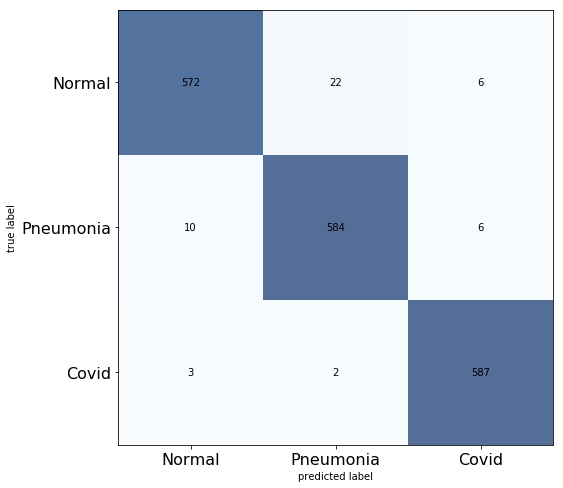

In [76]:
# Get the confusion matrix
cm  = confusion_matrix(orig_test_labels, max_preds)
plt.figure()
plot_confusion_matrix(cm,figsize=(12,8), hide_ticks=True, alpha=0.7,cmap=plt.cm.Blues)
plt.xticks(range(3), ['Normal', 'Pneumonia','Covid'], fontsize=16)
plt.yticks(range(3), ['Normal', 'Pneumonia','Covid'], fontsize=16)
plt.show()

In [77]:
# Calculate Precision and Recall
"""
tn, fp, fn, tp = cm.ravel()

precision = tp/(tp+fp)
recall = tp/(tp+fn)

print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))
"""

'\ntn, fp, fn, tp = cm.ravel()\n\nprecision = tp/(tp+fp)\nrecall = tp/(tp+fn)\n\nprint("Recall of the model is {:.2f}".format(recall))\nprint("Precision of the model is {:.2f}".format(precision))\n'

In [78]:
# Preparing test data
# Get the path to the sub-directories
normal_cases_dir = join(val_dir,'NORMAL')
pneumonia_cases_dir =join(val_dir,'Viral Pneumonia')
covid_cases_dir=join(val_dir,'COVID-19')

# Get the list of all the images
#normal_cases = normal_cases_dir.glob('*.jpeg')
#pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

import re

normal_cases = glob.glob(str(normal_cases_dir)+"/*")
pneumonia_cases = glob.glob(str(pneumonia_cases_dir)+"/*")
covid_cases = glob.glob(str(covid_cases_dir)+"/*")

def filter_aug(lst):
    new_lst=[]
    for each in lst:
        file_name=os.path.basename(str(each))
        if re.search("_clahe_applied",file_name) or re.search("_gamma_corrected",file_name) or re.search("_flip_horizontal",file_name):
            continue
            #basically skip those files
        else:
            new_lst.append(each)
    return new_lst
normal_cases=filter_aug(normal_cases)
pneumonia_cases=filter_aug(pneumonia_cases)
covid_cases=filter_aug(covid_cases)


"""

normal_cases_dir = join(test_dir ,'NORMAL')
pneumonia_cases_dir = join(test_dir ,'Viral Pneumonia')

normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')
"""
test_data = []
test_labels = []

for img in normal_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(0, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
                      
for img in pneumonia_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(1, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    
for img in covid_cases:
    #print(img)
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(2, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    

test_data = np.array(test_data)
test_labels = np.array(test_labels)

print("Total number of test examples: ", test_data.shape)
print("Total number of labels:", test_labels.shape)

Total number of test examples:  (748, 224, 224, 3)
Total number of labels: (748, 3)


In [79]:
# Evaluation on test dataset
test_loss, test_score = model.evaluate(test_data, test_labels, batch_size=16)
print("Loss on test set: ", test_loss)
print("Accuracy on test set: ", test_score)

748/748 [==============================] - 1s 2ms/step
Loss on test set:  0.13470498982438428
Accuracy on test set:  0.9692513368983957


In [80]:
# Get predictions
preds = model.predict(test_data, batch_size=16)
preds = np.argmax(preds, axis=-1)

# Original labels
orig_test_labels = np.argmax(test_labels, axis=-1)

print(orig_test_labels.shape)
print(preds.shape)

(748,)
(748,)


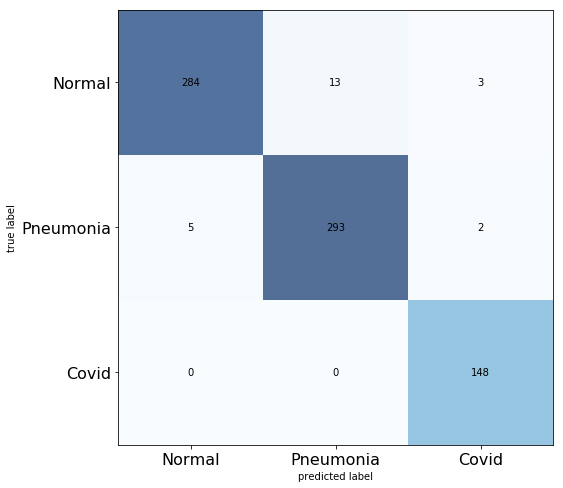

In [81]:
# Get the confusion matrix
cm  = confusion_matrix(orig_test_labels, preds)
plt.figure()
plot_confusion_matrix(cm,figsize=(12,8), hide_ticks=True, alpha=0.7,cmap=plt.cm.Blues)
plt.xticks(range(3), ['Normal', 'Pneumonia','Covid'], fontsize=16)
plt.yticks(range(3), ['Normal', 'Pneumonia','Covid'], fontsize=16)
plt.show()

In [82]:
!pip install keras-vis

You are using pip version 9.0.1, however version 20.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [83]:
#Grad cam! remaining
import keras
import tensorflow as tf
import vis ## keras-vis
import matplotlib.pyplot as plt
import numpy as np
print("keras      {}".format(keras.__version__))
print("tensorflow {}".format(tf.__version__))

keras      2.1.5
tensorflow 1.7.0-rc1


In [84]:

for layer in model.layers:
  print(layer.get_config())

{'batch_input_shape': (None, 224, 224, 3), 'dtype': 'float32', 'sparse': False, 'name': 'ImageInput'}
{'name': 'Conv0_1', 'trainable': True, 'filters': 32, 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': (1, 1), 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'VarianceScaling', 'config': {'scale': 1.0, 'mode': 'fan_avg', 'distribution': 'uniform', 'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
{'name': 'Conv0_2', 'trainable': True, 'filters': 32, 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': (1, 1), 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'VarianceScaling', 'config': {'scale': 1.0, 'mode': 'fan_avg', 'distribution': 'uniform', 'seed': N

In [85]:
from vis.utils import utils
# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
#layer_idx = utils.find_layer_idx(model, 'predictions')
layer_idx=-1
# Swap softmax with linear
model.layers[layer_idx].activation = keras.activations.linear
model = utils.apply_modifications(model)

In [86]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

/kaggle/working/data_aug/val/content/data/content/FINAL_AUG_DATA/Val/Viral Pneumonia/Viral Pneumonia (146)_clahe_applied.jpg
Original Dimensions :  (1024, 1024, 3)
Resized Dimensions :  (224, 224, 3)


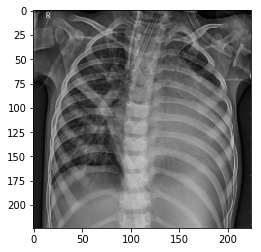

(1, 224, 224, 3)


In [87]:
import os, fnmatch
def find(pattern, path):
    result = []
    for root, dirs, files in os.walk(path):
        for name in files:
            if fnmatch.fnmatch(name, pattern):
                result.append(os.path.join(root, name))
    return result
img_file=find('*.jpg', '/kaggle/working/')
print(img_file[0])
import cv2
img=cv2.imread(img_file[0])

print('Original Dimensions : ',img.shape)
"""
scale_percent = 60 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
"""
width=height=224
dim = (width, height)
# resize image
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
 
print('Resized Dimensions : ',resized.shape)

#from google.colab.patches import cv2_imshow
#cv2.imshow("img",resized)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=resized
imgplot = plt.imshow(img)
plt.show()

#input_data.reshape((-1, image_side1, image_side2, channels))
x,y,z=resized.shape
image=resized.reshape((1, x, y, z))
print(image.shape)


In [88]:
try_data = []
for i in img_file[0:2]:
    img = cv2.imread(i)
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    #print(img)
    try_data.append(img)
try_data = np.array(try_data)

In [89]:
# Get predictions
preds = model.predict(try_data)
print(preds)
print(preds.shape)
max_preds = np.argmax(preds, axis=-1)

print(max_preds)
print(max_preds.shape)

[[-2.0573177  3.5027764 -0.8320213]
 [-2.1596086  6.272698  -3.4668837]]
(2, 3)
[1 1]
(2,)


In [90]:
test_data.shape

(748, 224, 224, 3)

In [91]:
test_labels.shape

(748, 3)

In [92]:
img = cv2.imread(img_file[0])
img = cv2.resize(img, (224,224))
if img.shape[2] ==1:
    img = np.dstack([img, img, img])
else:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.astype(np.float32)/255.
x,y,z=img.shape
image=img.reshape((1, x, y, z))
image.shape

(1, 224, 224, 3)

In [93]:
# Get predictions
preds = model.predict(image,batch_size=1)
print(preds)
print(preds.shape)
max_preds = np.argmax(preds, axis=-1)

print(max_preds)
print(max_preds.shape)

[[-2.0573175  3.502776  -0.8320215]]
(1, 3)
[1]
(1,)


In [94]:
# Get predictions
#preds = model.predict(test_data, batch_size=16)
new_preds= np.zeros((max_preds.shape[0],3))
#new_preds=np.array([0,0,0]*len(preds))
max_preds = np.argmax(preds, axis=-1)
for i in range(max_preds.shape[0]):
    current_class=max_preds[i]
    new_preds[i][current_class]=1
new_preds

array([[0., 1., 0.]])

In [95]:
#model.summary()
predicted_class_indices=list(new_preds)
predicted_class_indices


[array([0., 1., 0.])]

In [96]:
from vis.visualization import visualize_cam
import tensorflow as tf
#X = tf.cast(X,tf.float32)
penultimate_layer_idx = utils.find_layer_idx(model, "Conv4_3") 
#class_idx  = class_idxs_sorted[0]
"""
class_idx=Classes
class_idx=[[0]]
class_idx=[0,1]
class_idx=['Covid','Normal']
class_idx=[[0],[1]]

class_idx=np.array(predicted_class_indices)
class_idx = class_idx.astype(int)
#seed_input = np.float32(img)[:,:,:3]
seed_input = image
#XXX = tf.convert_to_tensor(XXX[:,:,:3])
#seed_input =tf.convert_to_tensor(image[:,:,:3])
#seed_input=np.float32(image)[:,:,:3]
#https://stackoverflow.com/questions/60174964/invalidargumenterror-input-depth-must-be-evenly-divisible-by-filter-depth-4-v

grad_top1  = visualize_cam(model, layer_idx, class_idx, seed_input, 
                           penultimate_layer_idx = penultimate_layer_idx,#None,
                           backprop_modifier     = None,
                           grad_modifier         = None)

"""

"\nclass_idx=Classes\nclass_idx=[[0]]\nclass_idx=[0,1]\nclass_idx=['Covid','Normal']\nclass_idx=[[0],[1]]\n\nclass_idx=np.array(predicted_class_indices)\nclass_idx = class_idx.astype(int)\n#seed_input = np.float32(img)[:,:,:3]\nseed_input = image\n#XXX = tf.convert_to_tensor(XXX[:,:,:3])\n#seed_input =tf.convert_to_tensor(image[:,:,:3])\n#seed_input=np.float32(image)[:,:,:3]\n#https://stackoverflow.com/questions/60174964/invalidargumenterror-input-depth-must-be-evenly-divisible-by-filter-depth-4-v\n\ngrad_top1  = visualize_cam(model, layer_idx, class_idx, seed_input, \n                           penultimate_layer_idx = penultimate_layer_idx,#None,\n                           backprop_modifier     = None,\n                           grad_modifier         = None)\n\n"

In [97]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

In [98]:
# Preparing test data
# Get the path to the sub-directories
normal_cases_dir = join(val_dir,'NORMAL')
pneumonia_cases_dir =join(val_dir,'Viral Pneumonia')
covid_cases_dir=join(val_dir,'COVID-19')

# Get the list of all the images
#normal_cases = normal_cases_dir.glob('*.jpeg')
#pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

import re

normal_cases = glob.glob(str(normal_cases_dir)+"/*")
pneumonia_cases = glob.glob(str(pneumonia_cases_dir)+"/*")
covid_cases = glob.glob(str(covid_cases_dir)+"/*")

def filter_aug(lst):
    new_lst=[]
    for each in lst:
        file_name=os.path.basename(str(each))
        if re.search("_clahe_applied",file_name) or re.search("_gamma_corrected",file_name) or re.search("_flip_horizontal",file_name):
            continue
            #basically skip those files
        else:
            new_lst.append(each)
    return new_lst
#normal_cases=filter_aug(normal_cases)
#pneumonia_cases=filter_aug(pneumonia_cases)
#covid_cases=filter_aug(covid_cases)


"""

normal_cases_dir = join(test_dir ,'NORMAL')
pneumonia_cases_dir = join(test_dir ,'Viral Pneumonia')

normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')
"""
test_data = []
test_labels = []

for img in normal_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(0, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
                      
for img in pneumonia_cases:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(1, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    
for img in covid_cases:
    #print(img)
    img = cv2.imread(str(img))
    img = cv2.resize(img, (224,224))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype(np.float32)/255.
    label = to_categorical(2, num_classes=3)
    test_data.append(img)
    test_labels.append(label)
    

test_data = np.array(test_data)
test_labels = np.array(test_labels)

print("Total number of test examples: ", test_data.shape)
print("Total number of labels:", test_labels.shape)

Total number of test examples:  (1792, 224, 224, 3)
Total number of labels: (1792, 3)


In [99]:
test_labels[1700]

array([0., 0., 1.])

In [100]:
test_labels = test_labels.astype(int)
test_labels[1700]

array([0, 0, 1])

In [101]:
test_labels[0]

array([1, 0, 0])

In [102]:
try_data=test_data[0:2]
try_data.shape

(2, 224, 224, 3)

In [103]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ImageInput (InputLayer)      (None, 224, 224, 3)       0         
_________________________________________________________________
Conv0_1 (Conv2D)             (None, 224, 224, 32)      896       
_________________________________________________________________
Conv0_2 (Conv2D)             (None, 224, 224, 32)      9248      
_________________________________________________________________
pool0 (MaxPooling2D)         (None, 112, 112, 32)      0         
_________________________________________________________________
Conv1_1 (SeparableConv2D)    (None, 112, 112, 64)      2400      
_________________________________________________________________
Conv1_2 (SeparableConv2D)    (None, 112, 112, 64)      4736      
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 56, 56, 64)        0         
__________

[1 0 0]
(224, 224, 3, 3)
(224, 224, 3)
2
Covid


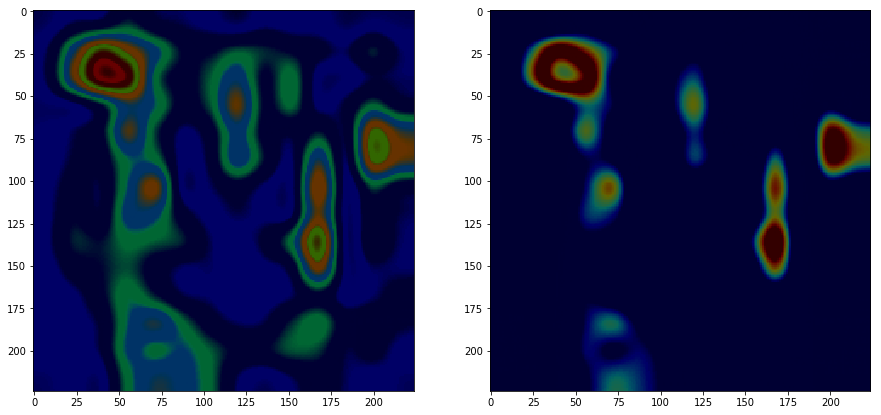

In [104]:
import matplotlib.cm as cm
from vis.visualization import visualize_cam,overlay
from keras import activations

#Find the fully connected output layer
layer_idx=utils.find_layer_idx(model,'fc3')
#Find the penultimate convolution layer
final_conv_layer=utils.find_layer_idx(model,'Conv4_3')

plt.figure()
f,ax=plt.subplots(1,2,figsize=(15,15))
value=1700
for i,img in enumerate(test_data[value:value+1]):
    grads=visualize_cam(model,#our DeepConvNet model
                       seed_input=img, #tf.cast(img,tf.float32),#each image in the try dataset
                       filter_indices=np.argmax(test_labels[value+i]), #None,#filter index for the final image
                       layer_idx=layer_idx,#last fully connected layer
                       penultimate_layer_idx=final_conv_layer)#penultimate convolution layer
    print(test_labels[i])
    #overlaying the heatmap on top of the original image
    jet_heatmap=np.uint8(cm.jet(grads)[...,:3]*255)
    print(jet_heatmap.shape)
    print(img.shape)
    #ax[0].imshow(overlay(jet_heatmap,img,alpha=0.4))
    ax[0].imshow(overlay(jet_heatmap[:,:,:,np.argmax(test_labels[i])],img,alpha=0.4))
    ax[1].imshow(overlay(jet_heatmap[:,:,np.argmax(test_labels[i]),:],img,alpha=0.4))

#ax[1].imshow(img)
code=np.argmax(test_labels[value+i])
CATEGORIES=["Normal","Pneumonia","Covid"]
print(code)
print(CATEGORIES[code])

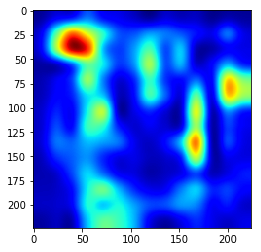

In [105]:
plt.imshow(grads)

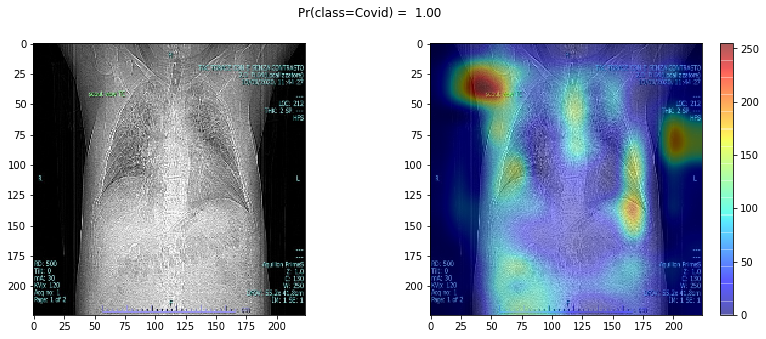

In [106]:
def plot_map(grads):
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    axes[0].imshow(img)
    axes[1].imshow(img)
    j = axes[1].imshow(grads,cmap="jet",alpha=0.4)
    fig.colorbar(j)
    classlabel=CATEGORIES
    class_idx=code
    plt.suptitle("Pr(class={}) = {:5.2f}".format(
                      classlabel[class_idx],
                      1.00))
plot_map(grads)
#https://fairyonice.github.io/Grad-CAM-with-keras-vis.html

In [107]:
grads.shape

(224, 224, 3)

In [108]:
%matplotlib inline

import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
import random
#https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0
#https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md

/kaggle/working/data_aug/val/content/data/content/FINAL_AUG_DATA/Val/COVID-19/COVID-19(162)_clahe_applied_gamma_corrected.jpg


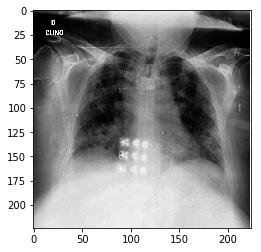

(1, 224, 224, 3)


In [109]:
#img_path = 'test_set/triangles/drawing(2).png'
img_file=find('*.jpg', '/kaggle/working/data_aug/val')
# Any number can be used in place of '3'. 
random.seed(244) 
img_path=img_file[random.choice(range(700))]
print(img_path)
img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

print(img_tensor.shape)

In [110]:
layer_outputs = [layer.output for layer in model.layers] 
# Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
# Creates a model that will return these outputs, given the model input

In [111]:
activations = activation_model.predict(img_tensor) # Returns a list of 28 Numpy arrays: one array per layer activation

In [112]:
len(activations)

28

In [113]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 3)


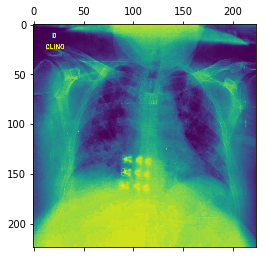

In [114]:
plt.matshow(first_layer_activation[0, :, :,2], cmap='viridis')

['ImageInput', 'Conv0_1', 'Conv0_2', 'pool0', 'Conv1_1', 'Conv1_2', 'pool1', 'Conv2_1', 'Conv2_2', 'pool2', 'Conv3_1', 'bn1', 'Conv3_2', 'bn2', 'Conv3_3', 'pool3', 'Conv4_1', 'bn3', 'Conv4_2', 'bn4', 'Conv4_3', 'pool4', 'flatten', 'fc1', 'dropout1', 'fc2', 'dropout2', 'fc3']


/opt/conda/lib/python3.6/site-packages/matplotlib/axes/_base.py:3239: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in true_divide
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in true_divide
/opt/conda/lib/python3.6/site-packages/matplotlib/axis.py:1032: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "
/opt/conda/lib/python3.6/site-packages/matplotlib/axis.py:1042: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


RuntimeError: libpng signaled error

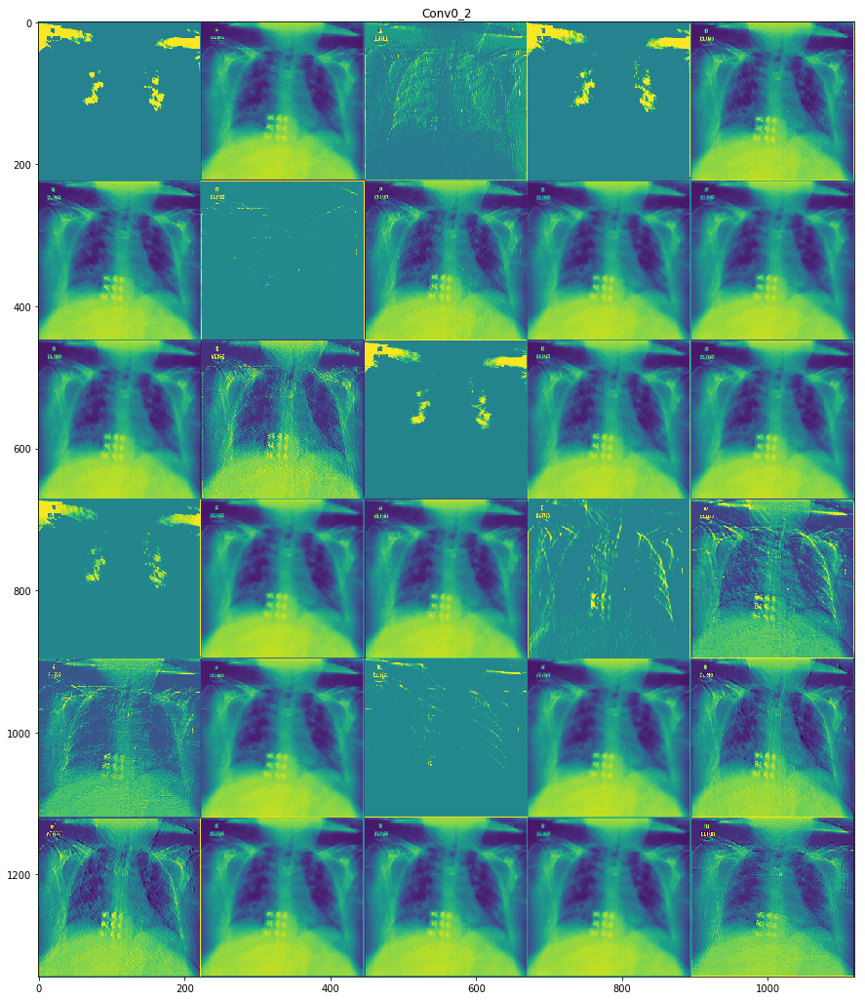

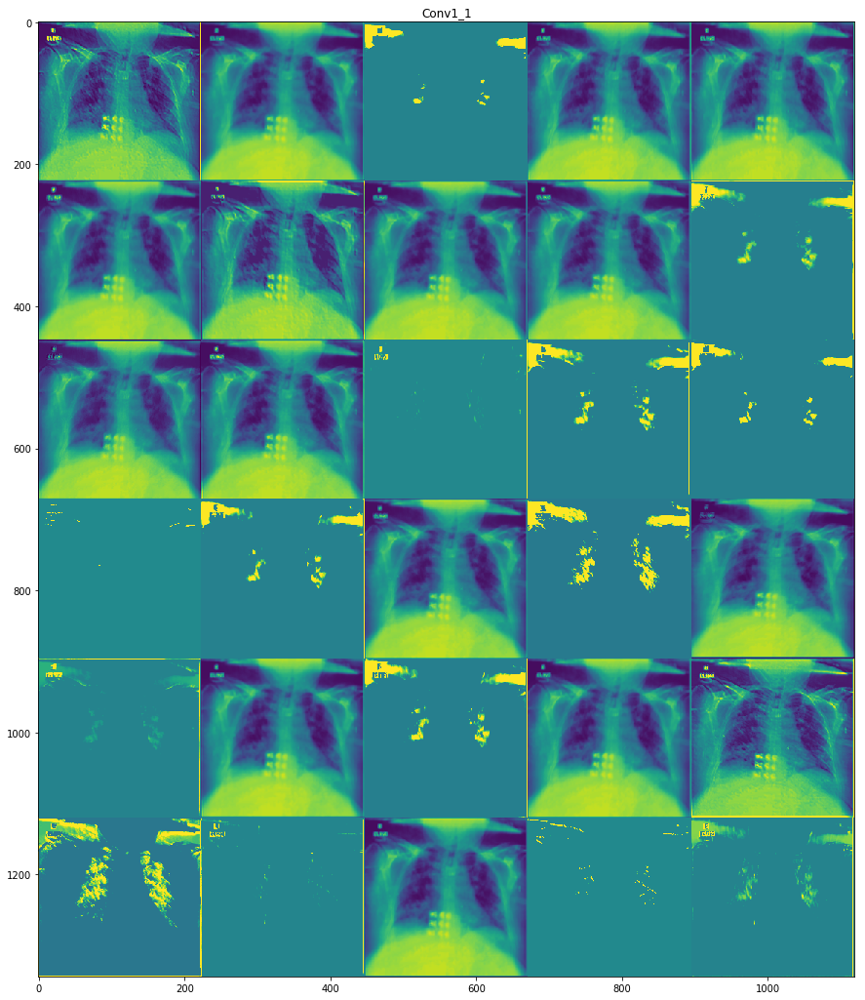

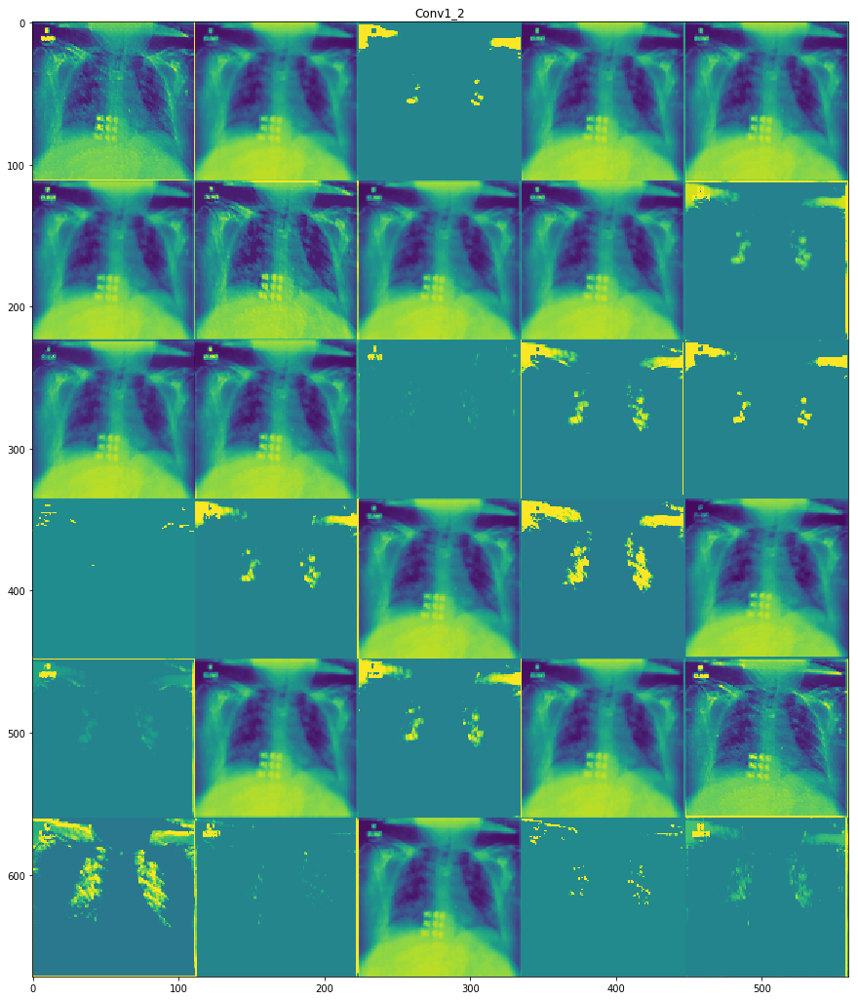

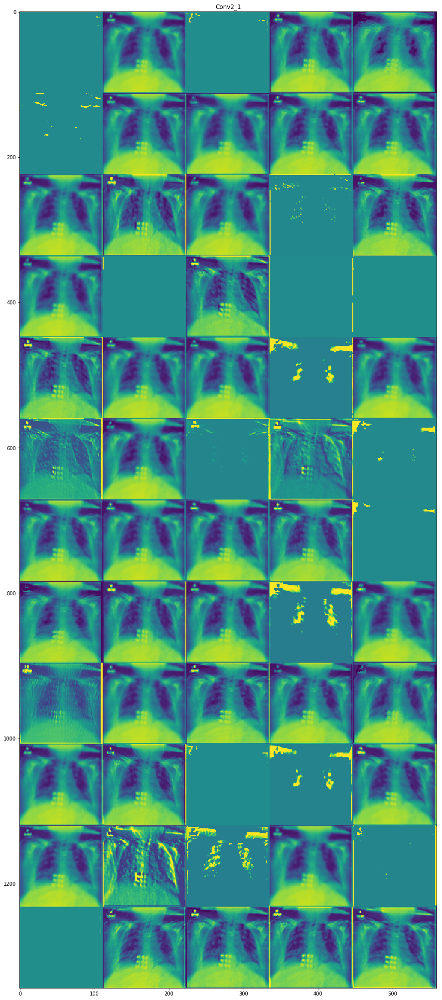

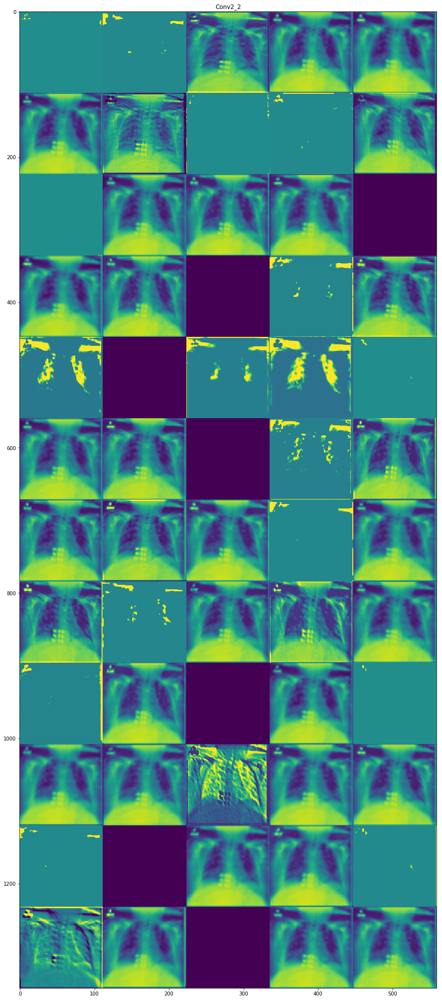

...

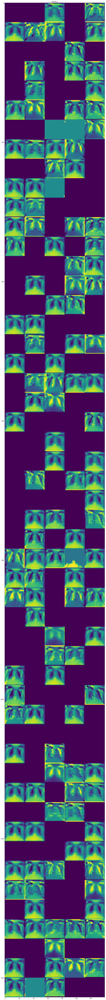

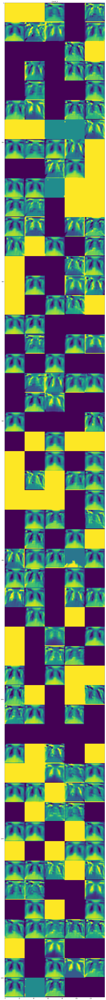

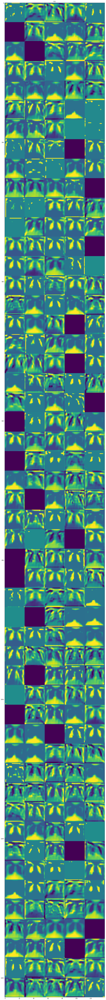

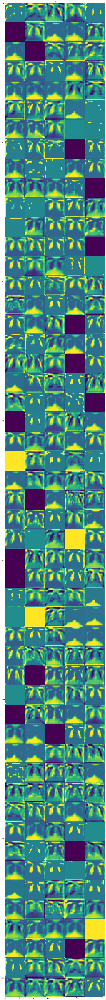

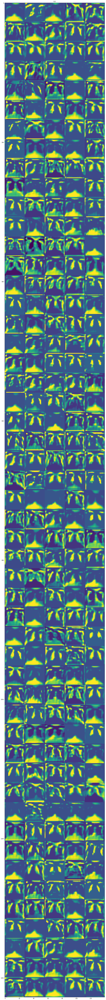

In [115]:
layer_names = []
for layer in model.layers:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
print(layer_names)
images_per_row = 5

#filter out Input,pool,bn,flatten,dropout layers
FILTER_OUT=["input","pool","bn","flatten","dropout"]
#regex search
def filter_layers(layer_names):
    filtered_layers=[]
    for each_layer in layer_names:
        add_this=True
        for filter_words in FILTER_OUT:
            if(re.search(filter_words,each_layer,re.IGNORECASE)):
                add_this=False

        if add_this==True:
            filtered_layers.append(each_layer)
    return filtered_layers

layer_names=filter_layers(layer_names)
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    try:
        n_features = layer_activation.shape[-1] # Number of features in the feature map
        size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
        n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        for col in range(n_cols): # Tiles each filter into a big horizontal grid
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, # Displays the grid
                             row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        scale=3*scale
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
    except RuntimeError:
        continue

In [116]:
test_labels[0]

array([1, 0, 0])

In [117]:
from vis.visualization import visualize_cam
#penultimate_layer_idx = utils.find_layer_idx(model, "block5_conv3") 
#class_idx  = class_idxs_sorted[0]
seed_input = img
"""
grad_top1  = visualize_cam(model, layer_idx, class_idx, seed_input, 
                           penultimate_layer_idx = penultimate_layer_idx,#None,
                           backprop_modifier     = None,
                           grad_modifier         = None)
                           """

'\ngrad_top1  = visualize_cam(model, layer_idx, class_idx, seed_input, \n                           penultimate_layer_idx = penultimate_layer_idx,#None,\n                           backprop_modifier     = None,\n                           grad_modifier         = None)\n                           '

Nice!!! So, our model has a 98% recall. In such problems, a good recall value is expected. But if you notice, the precision is only 80%. This is one thing to notice. Precision and Recall follows a trade-off, and you need to find a point where your recall, as well as your precision, is more than good but both can't increase simultaneously. 

That's it folks!! I hope you enjoyed this kernel. Happy Kaggling!!